## deep08_object_detection
>author : bae hueng myoung<br>
>date : 31 dec 2021

## data load

In [2]:
# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras

# Helper libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import os

import tensorflow_datasets as tfds

import copy
import cv2
from PIL import Image, ImageDraw

print('=3')

=3


In [3]:
# 다운로드에 매우 긴 시간이 소요됩니다. 
import urllib3
urllib3.disable_warnings()

data_dir = os.path.join(os.getenv("HOME"), "aiffel/deep08_object_detection/data")

(ds_train, ds_test), ds_info = tfds.load(
    'kitti',
    data_dir=data_dir,
    split=['train', 'test'],
    shuffle_files=True,
    with_info=True,
)

print('=3')

=3


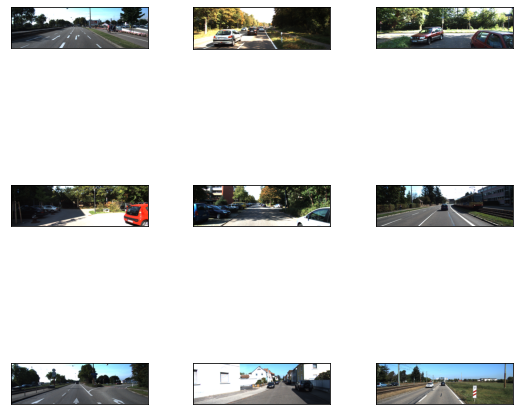

In [4]:
_ = tfds.show_examples(ds_train, ds_info)

In [5]:
ds_info

tfds.core.DatasetInfo(
    name='kitti',
    full_name='kitti/3.2.0',
    description="""
    Kitti contains a suite of vision tasks built using an autonomous driving
    platform. The full benchmark contains many tasks such as stereo, optical flow,
    visual odometry, etc. This dataset contains the object detection dataset,
    including the monocular images and bounding boxes. The dataset contains 7481
    training images annotated with 3D bounding boxes. A full description of the
    annotations can be found in the readme of the object development kit readme on
    the Kitti homepage.
    """,
    homepage='http://www.cvlibs.net/datasets/kitti/',
    data_path='/aiffel/aiffel/deep08_object_detection/data/kitti/3.2.0',
    download_size=11.71 GiB,
    dataset_size=5.27 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/file_name': Text(shape=(), dtype=tf.string),
        'objects': Sequence({
            'alpha': tf.float32

------Example------
['image', 'image/file_name', 'objects']
------objects------
{'alpha': <tf.Tensor: shape=(4,), dtype=float32, numpy=array([-1.68, -1.41,  0.8 , -1.21], dtype=float32)>, 'bbox': <tf.Tensor: shape=(4, 4), dtype=float32, numpy=
array([[0.42034668, 0.58811593, 0.54186666, 0.62884057],
       [0.24424   , 0.64577293, 0.53154665, 0.69934785],
       [0.00266667, 0.80391306, 0.77808   , 0.99919486],
       [0.34874666, 0.70363927, 0.5009867 , 0.7907568 ]], dtype=float32)>, 'dimensions': <tf.Tensor: shape=(4, 3), dtype=float32, numpy=
array([[2.  , 1.82, 4.43],
       [1.74, 0.82, 1.79],
       [2.2 , 1.9 , 5.53],
       [1.51, 1.69, 4.04]], dtype=float32)>, 'location': <tf.Tensor: shape=(4, 3), dtype=float32, numpy=
array([[ 6.79,  1.99, 34.13],
       [ 3.93,  1.79, 12.63],
       [ 3.76,  1.77,  2.91],
       [ 9.65,  1.97, 21.81]], dtype=float32)>, 'occluded': <tf.Tensor: shape=(4,), dtype=int64, numpy=array([0, 0, 0, 0])>, 'rotation_y': <tf.Tensor: shape=(4,), dtype=flo

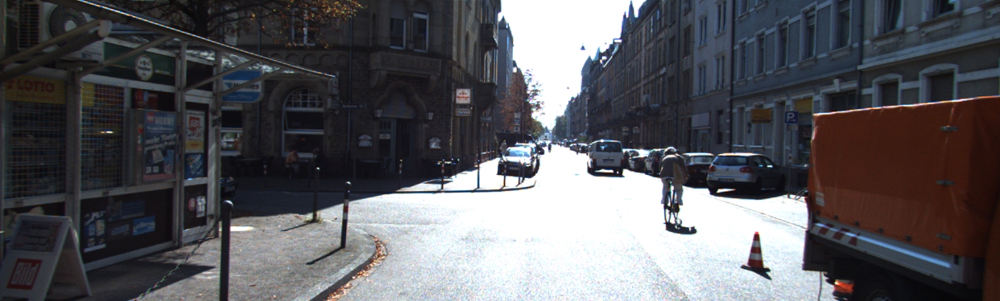

In [6]:
sample = ds_train.take(1)

for example in sample:  
    print('------Example------')
    print(list(example.keys())) # example is `{'image': tf.Tensor, 'label': tf.Tensor}`
    image = example["image"]
    filename = example["image/file_name"].numpy().decode('utf-8')
    objects = example["objects"]

print('------objects------')
print(objects)

img = Image.fromarray(image.numpy())
img

width: 1242  height: 375
(4, 4)
[730.44    217.37    781.01996 171.8    ]
[802.05 283.41 868.59 175.67]
[ 998.46  374.   1241.     83.22]
[873.92    244.22    982.12    187.12999]
<PIL.Image.Image image mode=RGB size=1242x375 at 0x7F0530431410>


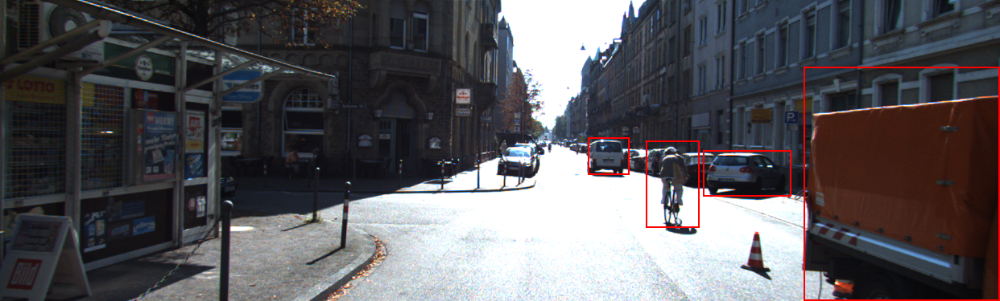

In [7]:
def visualize_bbox(input_image, object_bbox):
    input_image = copy.deepcopy(input_image)
    draw = ImageDraw.Draw(input_image)
    
    # 바운딩 박스 좌표(x_min, x_max, y_min, y_max) 구하기
    width, height = img.size
    print('width:', width, ' height:', height)
    print(object_bbox.shape)
    x_min = object_bbox[:,1] * width
    x_max = object_bbox[:,3] * width
    y_min = height - object_bbox[:,0] * height
    y_max = height - object_bbox[:,2] * height
    
    # 바운딩 박스 그리기
    rects = np.stack([x_min, y_min, x_max, y_max], axis=1)
    for _rect in rects:
        print(_rect)
        draw.rectangle(_rect, outline=(255,0,0), width=2)
    print(input_image)
    return input_image

visualize_bbox(img, objects['bbox'].numpy())

## keras retinanet :: data format

In [8]:
import os
data_dir = os.getenv('HOME') + '/aiffel/deep08_object_detection/data'
img_dir = data_dir + '/kitti_images'
train_csv_path = data_dir + '/kitti_train.csv'

# parse_dataset 함수를 구현해 주세요.
def parse_dataset(dataset, img_dir, total=0):
    if not os.path.exists(img_dir):
        os.mkdir(img_dir)
    # Dataset의 claas를 확인하여 class에 따른 index를 확인해둡니다.
    # 저는 기존의 class를 차와 사람으로 나누었습니다.
    type_class_map = {
        0: "car",
        1: "car",
        2: "car",
        3: "person",
        4: "person",
        5: "person",
    }
    # Keras retinanet을 학습하기 위한 dataset을 csv로 parsing하기 위해서 필요한 column을 가진 pandas.DataFrame을 생성합니다.
    df = pd.DataFrame(columns=["img_path", "x1", "y1", "x2", "y2", "class_name"])
    for item in tqdm(dataset, total=total):
        filename = item['image/file_name'].numpy().decode('utf-8')
        img_path = os.path.join(img_dir, filename)
        
        img = Image.fromarray(item['image'].numpy())
        img.save(img_path)
        object_bbox = item['objects']['bbox']
        object_type = item['objects']['type'].numpy()
        width, height = img.size
        
        # tf.dataset의 bbox좌표가 0과 1사이로 normalize된 좌표이므로 이를 pixel좌표로 변환합니다.
        x_min = object_bbox[:,1] * width
        x_max = object_bbox[:,3] * width
        y_min = height - object_bbox[:,2] * height
        y_max = height - object_bbox[:,0] * height
        
        # 한 이미지에 있는 여러 Object들을 한 줄씩 pandas.DataFrame에 append합니다.
        rects = np.stack([x_min, y_min, x_max, y_max], axis=1).astype(np.int)
        for i, _rect in enumerate(rects):
            _type = object_type[i]
            if _type not in type_class_map.keys():
                continue
            df = df.append({
                "img_path": img_path,
                "x1": _rect[0],
                "y1": _rect[1],
                "x2": _rect[2],
                "y2": _rect[3],
                "class_name": type_class_map[_type]
            }, ignore_index=True)
            
    return df
        
df_train = parse_dataset(ds_train, img_dir, total=ds_info.splits['train'].num_examples)
df_train.to_csv(train_csv_path, sep=',', index=False, header=False)

100%|██████████| 6347/6347 [25:06<00:00,  4.21it/s]


In [9]:
test_csv_path = data_dir + '/kitti_test.csv'

df_test = parse_dataset(ds_test, img_dir, total=ds_info.splits['test'].num_examples)
df_test.to_csv(test_csv_path, sep=',', index=False, header=False)

100%|██████████| 711/711 [02:53<00:00,  4.09it/s]


## keras retinanet :: settings

In [10]:
class_txt_path = data_dir + '/classes.txt'

def save_class_format(path):
    class_type_map = {
        "car" : 0,
        "person": 1
    }
    with open(path, mode='w', encoding='utf-8') as f:
        for k, v in class_type_map.items():
            f.write(f"{k},{v}\n")
    print('Done')
            
save_class_format(class_txt_path)

Done


In [13]:
# RetinaNet 훈련이 시작됩니다!! 10epoch 훈련에 1시간 이상 소요될 수 있습니다. 
!cd ~/aiffel/deep08_object_detection && python keras-retinanet/keras_retinanet/bin/train.py --gpu 0 --multiprocessing --workers 4 --batch-size 2 --epochs 10 --steps 195 csv data/kitti_train.csv data/classes.txt
print("Done")

2021-12-31 06:17:36.745510: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-12-31 06:17:38.745741: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-12-31 06:17:38.746760: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-12-31 06:17:38.771256: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-31 06:17:38.772077: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:00:1e.0 name: Tesla K80 computeCapability: 3.7
coreClock: 0.8755GHz coreCount: 13 deviceMemorySize: 11.17GiB deviceMemoryBandwidth: 223.96GiB/s
2021-12-31 06:17:38.772124: I tensorflow/stream_executor/platform/default/dso_lo

In [14]:
!cd ~/aiffel/deep08_object_detection && python keras-retinanet/keras_retinanet/bin/convert_model.py snapshots/resnet50_csv_10.h5 snapshots/resnet50_csv_10_infer.h5
print("Done")

2021-12-31 07:15:00.390187: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-12-31 07:15:02.312734: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-12-31 07:15:02.313940: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-12-31 07:15:02.337824: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-12-31 07:15:02.338640: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:00:1e.0 name: Tesla K80 computeCapability: 3.7
coreClock: 0.8755GHz coreCount: 13 deviceMemorySize: 11.17GiB deviceMemoryBandwidth: 223.96GiB/s
2021-12-31 07:15:02.338695: I tensorflow/stream_executor/platform/default/dso_lo

## keras retinanet :: visualization 

In [17]:
%matplotlib inline

# automatically reload modules when they have changed
%load_ext autoreload
%autoreload 2

# import keras
import keras

# import keras_retinanet
from keras_retinanet import models
from keras_retinanet.models import load_model
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color
from keras_retinanet.utils.gpu import setup_gpu

# import miscellaneous modules
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
import time

gpu = '0'
setup_gpu(gpu)

dir_path = os.getenv('HOME') + '/aiffel/deep08_object_detection/'
model_path = os.path.join(dir_path, 'snapshots', 'resnet50_csv_10_infer.h5')
model = load_model(model_path, backbone_name='resnet50')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Physical devices cannot be modified after being initialized
1 Physical GPUs, 1 Logical GPUs


[594.5258  177.16057 624.1084  206.64958]
width is: 29.58258
height is: 29.489014
[191.52533 133.939   351.69098 234.39384]
width is: 160.16565
height is: 100.45485
[374.31378 182.49684 417.35513 208.11665]
width is: 43.04135
height is: 25.619812
[532.9682  161.75124 562.15497 191.13275]


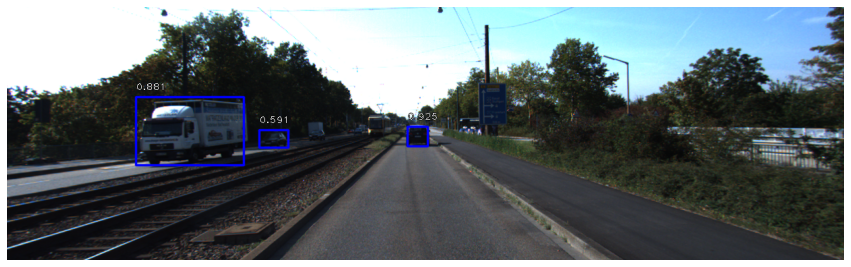

False

In [75]:
import os
img_path = os.getenv('HOME')+'/aiffel/deep08_object_detection/test_set/go_1.png'

# inference_on_image 함수를 구현해 주세요.
def inference_on_image(model, img_path, visualize=True):
    image = read_image_bgr(img_path)

    # copy to draw on
    draw = image.copy()
    draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

    color_map = {
        0: (0, 0, 255), # blue
        1: (255, 0, 0) # red
    }

    # preprocess image for network
    image = preprocess_image(image)
    image, scale = resize_image(image)

    # process image
    boxes, scores, labels = model.predict_on_batch(np.expand_dims(image, axis=0))

    # correct for image scale
    boxes /= scale

    # object infor 딕셔너리를 만들어 레이블과 물체의 박스 사이즈를 저장
    stop = False
    
    # display images
    if  visualize:
        for box, score, label in zip(boxes[0], scores[0], labels[0]):
            print(box)
            if score < 0.5:
                break
            b = box.astype(int)
            draw_box(draw, b, color=color_map[label])

            caption = "{:.3f}".format(score)
            draw_caption(draw, b, caption)      

            ## go or stop condition applying
            width = box[2]-box[0]
            height = box[3]-box[1]
            print('width is:' , width)
            print('height is:', height)
            if (label == 1) or (width > 300 or height > 300):
                stop = True
                
        plt.figure(figsize=(15, 15))
        plt.axis('off')
        plt.imshow(draw)
        plt.show()                      
                
        return stop
    
stop = inference_on_image(model, img_path)
stop

[778.5142  143.79852 840.2922  325.2498 ]
[742.6562  137.26776 868.1554  326.18405]


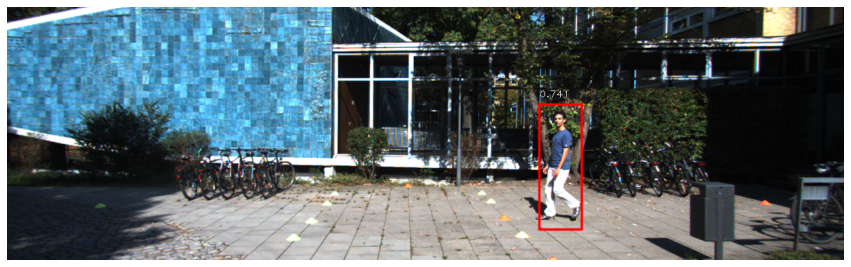

True

In [65]:
img_path = os.getenv('HOME')+'/aiffel/deep08_object_detection/test_set/stop_1.png'
stop = inference_on_image(model, img_path)
stop

## inference of test all img 

[778.5142  143.79852 840.2922  325.2498 ]
1
[742.6562  137.26776 868.1554  326.18405]


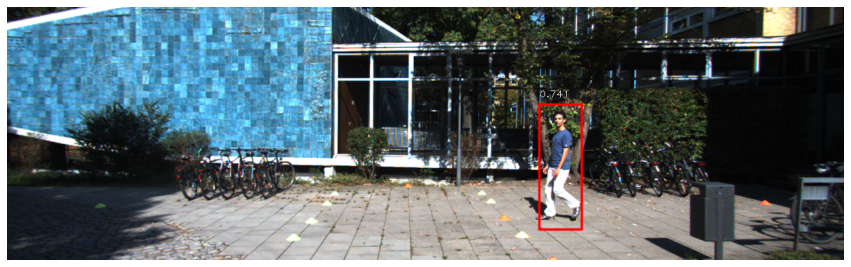

[429.6904  151.90462 494.88123 337.9721 ]
1
[390.0081  148.067   511.13214 351.70947]


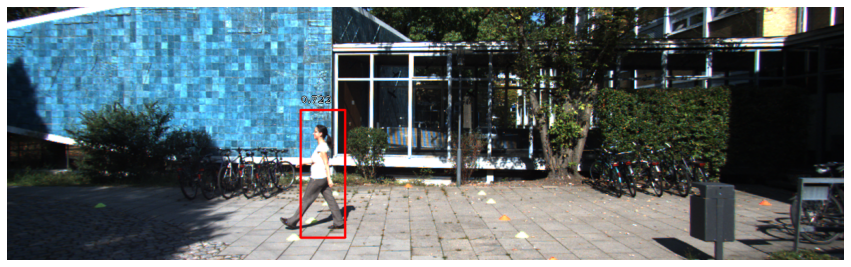

[  0.      199.6766  301.71402 369.12827]
0
[748.37286 160.40442 893.56506 207.91159]
0
[1004.8873   141.83253 1040.0134   229.75208]
1
[ 992.7671   139.55609 1028.8474   226.97522]


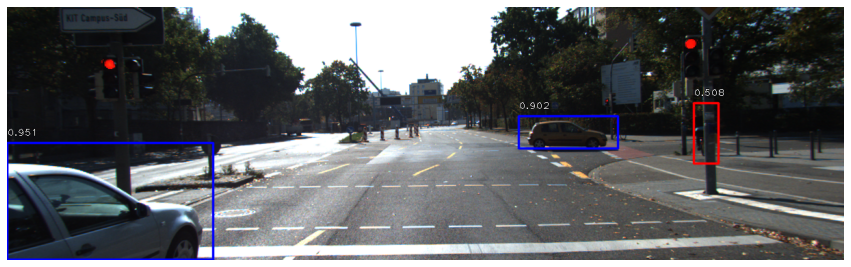

[659.2049  143.48943 735.4013  227.9872 ]
0
[ 63.598545 155.65419  360.38965  300.26993 ]
0
[433.41953 160.11429 555.4161  204.22134]
0
[ 704.84735   88.50146 1118.8188   370.80753]
0
[358.36908 170.5757  483.1249  216.60425]
0
[388.594   168.45042 533.34326 211.55284]
0
[157.87892 163.75986 386.03516 271.58435]
0
[652.78845 160.00406 711.79614 218.16771]


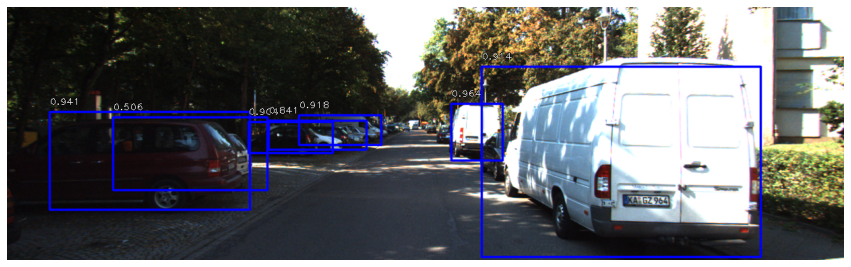

[ 878.4368   181.75299 1241.0684   373.6249 ]
0
[736.57    165.82037 856.93134 251.92705]
0
[570.89307 179.12335 615.94275 214.1984 ]
0
[704.56415 147.99683 776.65955 219.52385]
0
[713.0354  153.12155 823.79175 239.37894]
0
[697.32544 156.95628 754.53033 212.2787 ]
0
[586.0955  176.59888 628.5001  205.98242]


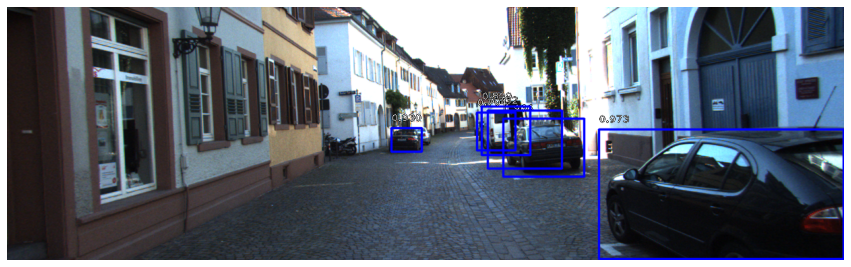

[594.5258  177.16057 624.1084  206.64958]
0
[191.52533 133.939   351.69098 234.39384]
0
[374.31378 182.49684 417.35513 208.11665]
0
[532.9682  161.75124 562.15497 191.13275]


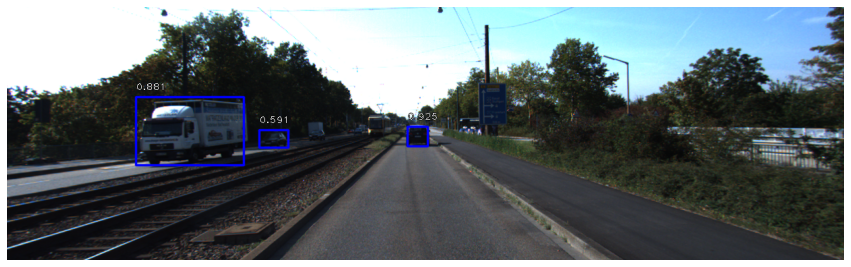

[518.3032  175.61234 573.07745 212.98532]
0
[628.88416 176.14557 664.9762  212.4432 ]
0
[534.1844  172.50908 584.2774  204.71265]
0
[557.4525  171.03809 592.6572  195.9711 ]


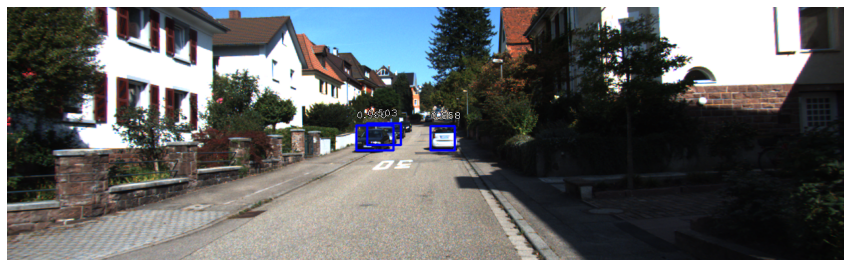

[817.2888  150.48407 885.8263  176.5171 ]
0
[542.00574 167.43576 567.90857 190.85512]


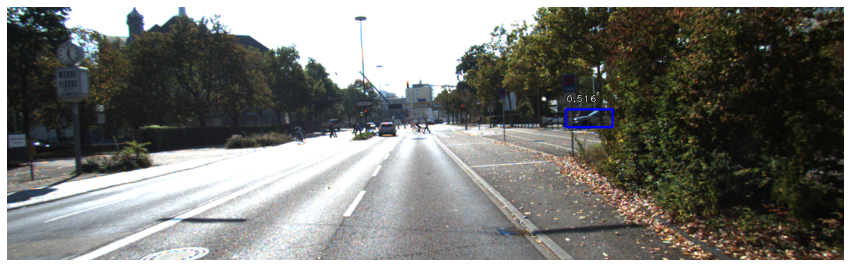

[692.26654 169.07947 792.39905 255.87532]
0
[680.08136 188.02286 751.3563  235.64351]


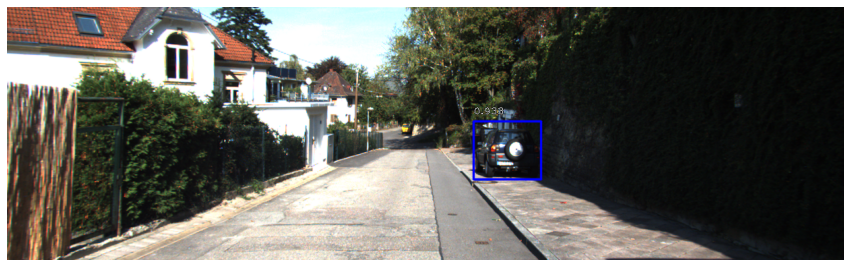

[  1.5054485 182.4172    238.83762   305.16766  ]
0
[152.32149 180.445   342.25552 256.39395]
0
[ 63.11619 184.66472 318.16852 270.77887]
0
[442.2303  178.50392 494.0039  207.63257]
0
[211.92249 178.16959 360.9334  238.17491]
0
[460.66425 178.74142 507.70422 205.08704]
0
[338.80328 176.19711 444.55597 221.41943]


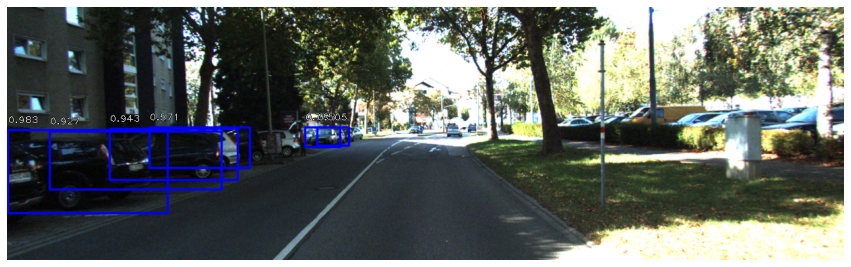

In [56]:
base_dir = os.getenv('HOME')+'/aiffel/deep08_object_detection/'

test_set=[
    ("test_set/stop_1.png", "Stop"),
    ("test_set/stop_2.png", "Stop"),
    ("test_set/stop_3.png", "Stop"),
    ("test_set/stop_4.png", "Stop"),
    ("test_set/stop_5.png", "Stop"),
    ("test_set/go_1.png", "Go"),
    ("test_set/go_2.png", "Go"),
    ("test_set/go_3.png", "Go"),
    ("test_set/go_4.png", "Go"),
    ("test_set/go_5.png", "Go"),
]

for f,r in test_set:
    score_list = inference_on_image(model, base_dir+f)
    score_list

# prj

[778.5142  143.79852 840.2922  325.2498 ]
[742.6562  137.26776 868.1554  326.18405]


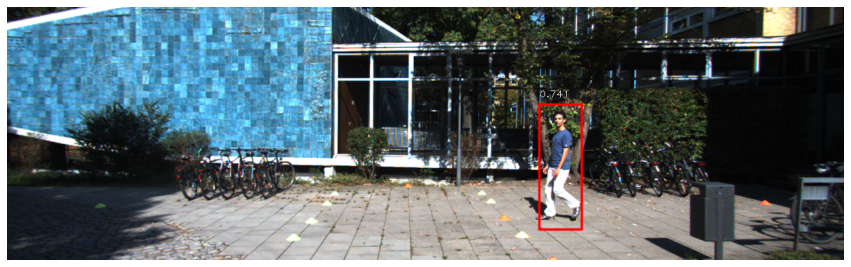

Stop


In [68]:
img_path = os.getenv('HOME')+'/aiffel/deep08_object_detection/test_set/stop_1.png'

def self_drive_assist(img_path, size_limit=300):
    stop = inference_on_image(model, img_path)
    if stop == False:
        return 'Go'
    else:
        return 'Stop'
    
print(self_drive_assist(img_path))

[778.5142  143.79852 840.2922  325.2498 ]
width is: 61.777954
height is: 181.45126
[742.6562  137.26776 868.1554  326.18405]


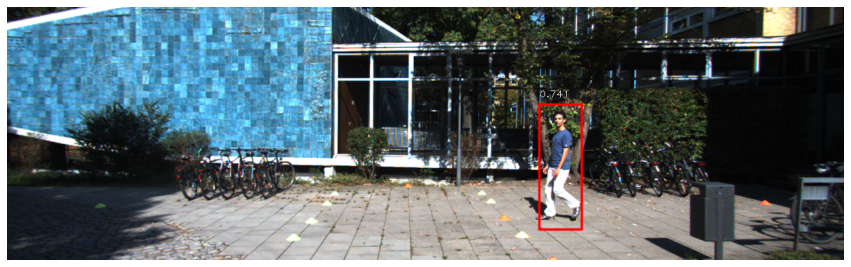

predction Stop
answer Stop
[429.6904  151.90462 494.88123 337.9721 ]
width is: 65.19083
height is: 186.06749
[390.0081  148.067   511.13214 351.70947]


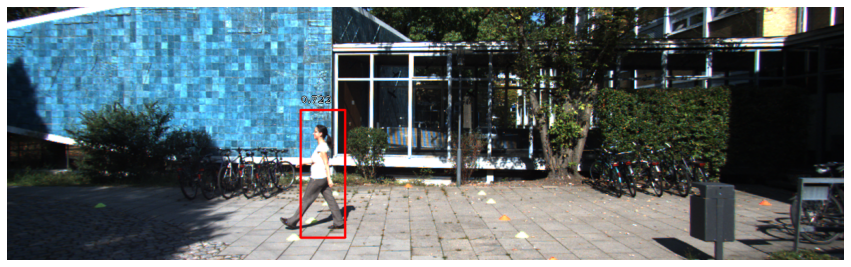

predction Stop
answer Stop
[  0.      199.6766  301.71402 369.12827]
width is: 301.71402
height is: 169.45166
[748.37286 160.40442 893.56506 207.91159]
width is: 145.1922
height is: 47.50717
[1004.8873   141.83253 1040.0134   229.75208]
width is: 35.1261
height is: 87.91954
[ 992.7671   139.55609 1028.8474   226.97522]


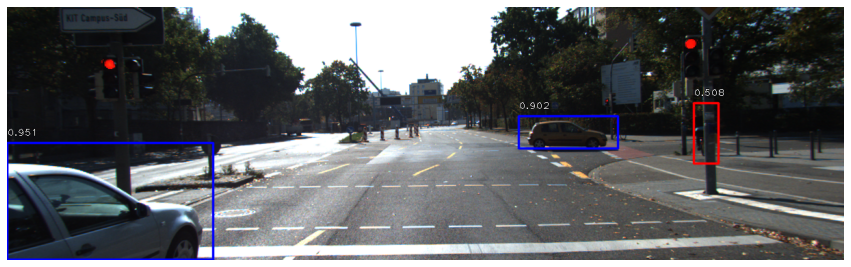

predction Stop
answer Stop
[659.2049  143.48943 735.4013  227.9872 ]
width is: 76.19641
height is: 84.49777
[ 63.598545 155.65419  360.38965  300.26993 ]
width is: 296.7911
height is: 144.61574
[433.41953 160.11429 555.4161  204.22134]
width is: 121.99655
height is: 44.107056
[ 704.84735   88.50146 1118.8188   370.80753]
width is: 413.9715
height is: 282.30606
[358.36908 170.5757  483.1249  216.60425]
width is: 124.75583
height is: 46.02855
[388.594   168.45042 533.34326 211.55284]
width is: 144.74927
height is: 43.102417
[157.87892 163.75986 386.03516 271.58435]
width is: 228.15623
height is: 107.82449
[652.78845 160.00406 711.79614 218.16771]


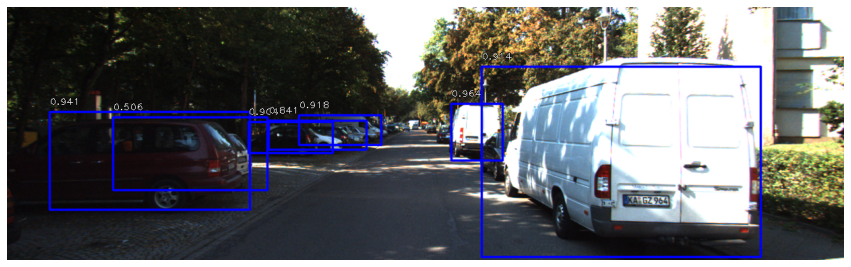

predction Stop
answer Stop
[ 878.4368   181.75299 1241.0684   373.6249 ]
width is: 362.63153
height is: 191.87192
[736.57    165.82037 856.93134 251.92705]
width is: 120.36133
height is: 86.106674
[570.89307 179.12335 615.94275 214.1984 ]
width is: 45.049683
height is: 35.075043
[704.56415 147.99683 776.65955 219.52385]
width is: 72.0954
height is: 71.52702
[713.0354  153.12155 823.79175 239.37894]
width is: 110.75635
height is: 86.257385
[697.32544 156.95628 754.53033 212.2787 ]
width is: 57.204895
height is: 55.32242
[586.0955  176.59888 628.5001  205.98242]


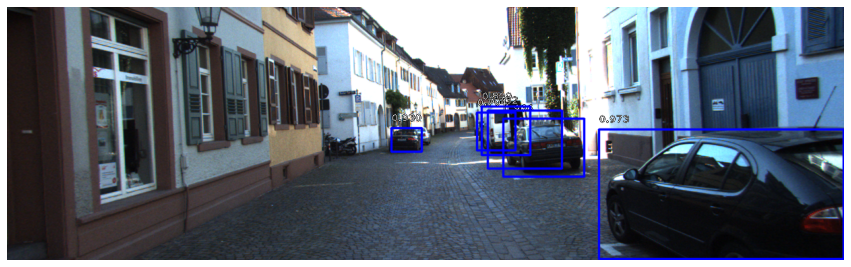

predction Stop
answer Stop
[594.5258  177.16057 624.1084  206.64958]
width is: 29.58258
height is: 29.489014
[191.52533 133.939   351.69098 234.39384]
width is: 160.16565
height is: 100.45485
[374.31378 182.49684 417.35513 208.11665]
width is: 43.04135
height is: 25.619812
[532.9682  161.75124 562.15497 191.13275]


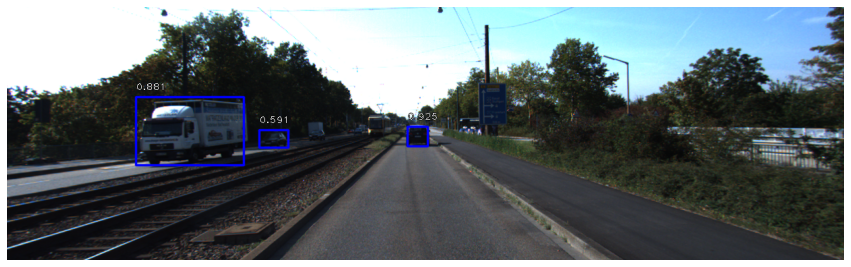

predction Go
answer Go
[518.3032  175.61234 573.07745 212.98532]
width is: 54.77423
height is: 37.372986
[628.88416 176.14557 664.9762  212.4432 ]
width is: 36.09204
height is: 36.297638
[534.1844  172.50908 584.2774  204.71265]
width is: 50.093018
height is: 32.203568
[557.4525  171.03809 592.6572  195.9711 ]


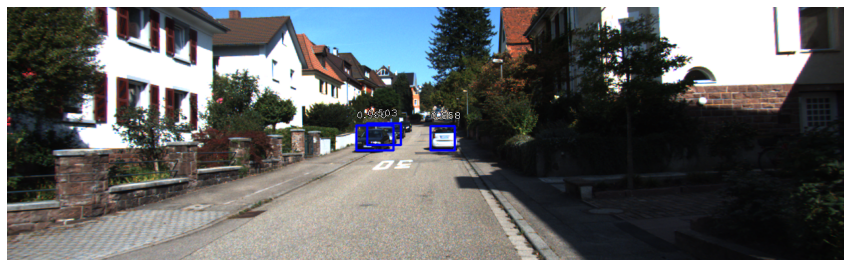

predction Go
answer Go
[817.2888  150.48407 885.8263  176.5171 ]
width is: 68.537476
height is: 26.033035
[542.00574 167.43576 567.90857 190.85512]


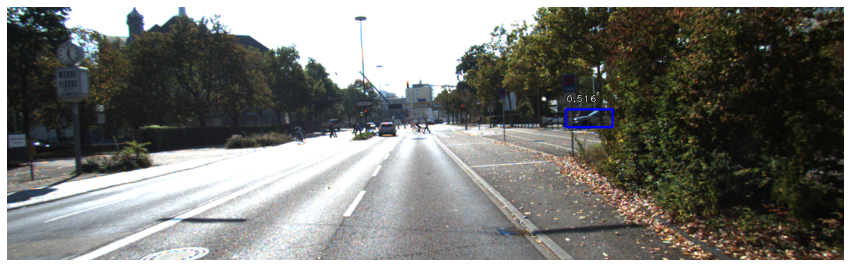

predction Go
answer Go
[692.26654 169.07947 792.39905 255.87532]
width is: 100.13251
height is: 86.79585
[680.08136 188.02286 751.3563  235.64351]


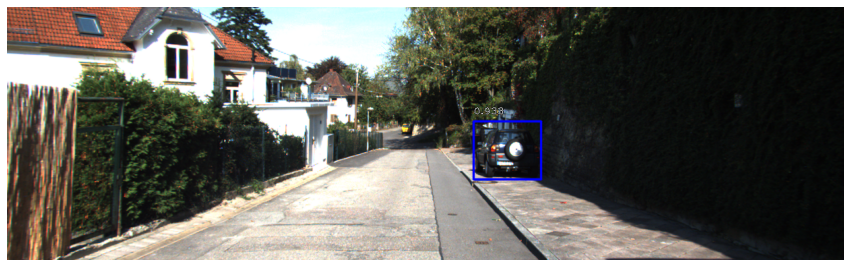

predction Go
answer Go
[  1.5054485 182.4172    238.83762   305.16766  ]
width is: 237.33217
height is: 122.75046
[152.32149 180.445   342.25552 256.39395]
width is: 189.93404
height is: 75.948944
[ 63.11619 184.66472 318.16852 270.77887]
width is: 255.05232
height is: 86.11415
[442.2303  178.50392 494.0039  207.63257]
width is: 51.77362
height is: 29.128647
[211.92249 178.16959 360.9334  238.17491]
width is: 149.01093
height is: 60.005325
[460.66425 178.74142 507.70422 205.08704]
width is: 47.039978
height is: 26.345612
[338.80328 176.19711 444.55597 221.41943]


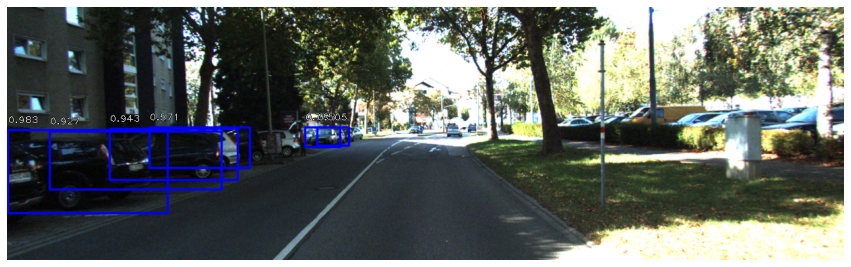

predction Go
answer Go
100점입니다.


In [76]:
import os

def test_system(func):
    work_dir = os.getenv('HOME')+'/aiffel/deep08_object_detection'
    score = 0
    test_set=[
        ("test_set/stop_1.png", "Stop"),
        ("test_set/stop_2.png", "Stop"),
        ("test_set/stop_3.png", "Stop"),
        ("test_set/stop_4.png", "Stop"),
        ("test_set/stop_5.png", "Stop"),
        ("test_set/go_1.png", "Go"),
        ("test_set/go_2.png", "Go"),
        ("test_set/go_3.png", "Go"),
        ("test_set/go_4.png", "Go"),
        ("test_set/go_5.png", "Go"),
    ]
    
    for image_file, answer in test_set:
        image_path = work_dir + '/' + image_file
        pred = func(image_path)
        print('predction',pred)
        print('answer',answer)
        if pred == answer:
            score += 10
    print(f"{score}점입니다.")

test_system(self_drive_assist)

## Anlaysis

레티나넷 모델로 오브젝트를 디텍션하고 레이블을 얼마나 잘 처리하는지에 대한 결과를 위에서 확인할 수 있다. 총 10장의 테스트 데이터로 사람을 디텍션 하거나 혹은 물체의 크기가 300픽셀 이상일 떄 stop이라는 레이블을 생성해내야 한다. 위의 결과에서 10장 중 10장을 성공시켰다. 이는 모델이 꽤나 디텍션하는데 좋은 성능을 보이고 있음을 보여준다. 하지만 실제 고, 스탑의 조건은 위와같이 단순하지 않다. 아무리 카메라에 담긴 물체의 크기가 트럭과 같이 사이즈가 크다고 하여도 다른 차선에 주행중일 때 스탑을 할 필요가 없다. 더군다나 사람이 카메라에 잡혀도 현재 모빌리티의 속도와 위치와 사람의 속도와 위치를 고려하여 충돌 가능성이 매우 희박한 경우 스탑을 할 필요가 없다. 따라서 주행에 있어 충돌회피 가능성을 염두하여 설계하여야 할 것이다.